In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
import pytesseract as pt
import plotly.express as px
import matplotlib.pyplot as plt
import xml.etree.ElementTree as xet

from glob import glob
from skimage import io
from shutil import copy
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [2]:
path = glob('C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/annotations/test/*.xml')
labels_dict = dict(filepath=[],xmin=[],xmax=[],ymin=[],ymax=[])
for filename in path:

    info = xet.parse(filename)
    root = info.getroot()
    member_object = root.find('object')
    labels_info = member_object.find('bndbox')
    xmin = int(labels_info.find('xmin').text)
    xmax = int(labels_info.find('xmax').text)
    ymin = int(labels_info.find('ymin').text)
    ymax = int(labels_info.find('ymax').text)

    labels_dict['filepath'].append(filename)
    labels_dict['xmin'].append(xmin)
    labels_dict['xmax'].append(xmax)
    labels_dict['ymin'].append(ymin)
    labels_dict['ymax'].append(ymax)

In [3]:
df = pd.DataFrame(labels_dict)
df.to_csv('labels.csv',index=False)
df.head()

,filepath,xmin,xmax,ymin,ymax
0,C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggl...,3,287,2,115
1,C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggl...,6,570,1,229
2,C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggl...,4,629,3,325
3,C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggl...,2,494,2,220
4,C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggl...,5,453,3,173


In [4]:
filename = df['filepath'][0]
def getFilename(filename):
    filename_image = xet.parse(filename).getroot().find('filename').text
    filepath_image = os.path.join('C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/',filename_image)
    return filepath_image
getFilename(filename)

'C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/351.E 6730 RC-07-19.jpeg'

In [5]:
image_path = list(df['filepath'].apply(getFilename))
image_path[:10]#random check

['C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/351.E 6730 RC-07-19.jpeg',
 'C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/352.E 5053 RG-09-20.jpeg',
 'C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/353.E 6270 SM-06-20.jpeg',
 'C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/354.E 6250 PAJ-02-22.jpeg',
 'C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/355.E 6547 PAF-09-21.jpeg',
 'C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/356.E 6225 SJ-11-19.jpeg',
 'C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/357.E 4679 PAD-06-21.jpg',
 'C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/358.E 3438 SJ-10-19.jpg',
 'C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/359.E 6270 OZ-01-21.jpg',
 'C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/360.E 4690 PAL-04-22.jpg']

In [8]:
file_path = "C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/IMG-20180108-WA0120.jpg" 
# xmin-494/ymin-290/xmax-659/ymax-344 
img = io.imread(file_path) #Read the image
fig = px.imshow(img)
fig.update_layout(width=600, height=500, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='IMG-20180108-WA0120.jpg - Plate Number AD 8594 TU')
fig.add_shape(type='rect',x0=490, x1=660, y0=287, y1=344, xref='x', yref='y',line_color='yellow')

In [9]:
#Targeting all our values in array selecting all columns
labels = df.iloc[:,1:].values
data = []
output = []
for ind in range(len(image_path)):
    image = image_path[ind]
    img_arr = cv2.imread(image)
    h,w,d = img_arr.shape

    
    # Prepprocesing
    load_image = load_img(image,target_size=(224,224))
    load_image_arr = img_to_array(load_image)
    norm_load_image_arr = load_image_arr/255.0 # Normalization
    
    
    # Normalization to labels
    xmin,xmax,ymin,ymax = labels[ind]
    nxmin,nxmax = xmin/w,xmax/w
    nymin,nymax = ymin/h,ymax/h
    label_norm = (nxmin,nxmax,nymin,nymax) # Normalized output
    
    
    # Append
    data.append(norm_load_image_arr)
    output.append(label_norm)

In [10]:
# Convert data to array
X = np.array(data,dtype=np.float32)
y = np.array(output,dtype=np.float32)

In [11]:
# Split the data into training and testing set using sklearn.
x_train,x_test,y_train,y_test = train_test_split(X,y,train_size=0.8,random_state=0)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((24, 224, 224, 3), (6, 224, 224, 3), (24, 4), (6, 4))

In [12]:
inception_resnet = InceptionResNetV2(weights="imagenet",include_top=False, input_tensor=Input(shape=(224,224,3)))
# ---------------------
headmodel = inception_resnet.output
headmodel = Flatten()(headmodel)
headmodel = Dense(500,activation="relu")(headmodel)
headmodel = Dense(250,activation="relu")(headmodel)
headmodel = Dense(4,activation='sigmoid')(headmodel)


# ---------- model
model = Model(inputs=inception_resnet.input,outputs=headmodel)

In [11]:
# Complie model
model.compile(loss='mse',optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4))
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 111, 111, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 111, 111, 32  96         ['conv2d[0][0]']                 
 alization)                     )                                                             

In [12]:
#tfb = TensorBoard('object_detection')
#history = model.fit(x=x_train,y=y_train,batch_size=10,epochs=180,
#                    validation_data=(x_test,y_test),callbacks=[tfb])

In [13]:
#model.save('./object_detectionss.h5')

In [13]:
# Load model
model = tf.keras.models.load_model('./object_detection.h5')
print('Model loaded Sucessfully')

Model loaded Sucessfully


In [14]:
path = "C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/IMG-20180108-WA0114.jpg"
image = load_img(path) # PIL object
image = np.array(image,dtype=np.uint8) # 8 bit array (0,255)
image1 = load_img(path,target_size=(224,224))
image_arr_224 = img_to_array(image1)/255.0  # Convert into array and get the normalized output

# Size of the orginal image
h,w,d = image.shape
print('Height of the image =',h)
print('Width of the image =',w)

Height of the image = 585
Width of the image = 1040


In [15]:
fig = px.imshow(image)
fig.update_layout(width=700, height=400,  margin=dict(l=10, r=10, b=10, t=10), xaxis_title='Figure 13 - TEST Image')

In [16]:
image_arr_224.shape

(224, 224, 3)

In [17]:
test_arr = image_arr_224.reshape(1,224,224,3)
test_arr.shape

(1, 224, 224, 3)

In [18]:
# Make predictions
coords = model.predict(test_arr)
coords

1/1 [==============================] - 4s 4s/step


array([[0.4792206 , 0.63233536, 0.5783431 , 0.6835643 ]], dtype=float32)

In [19]:
# Denormalize the values
denorm = np.array([w,w,h,h])
coords = coords * denorm
coords

array([[498.38942289, 657.62877941, 338.33070964, 399.8851186 ]])

In [20]:
coords = coords.astype(np.int32)
coords

array([[498, 657, 338, 399]])

In [21]:
# Draw bounding on top the image
xmin, xmax,ymin,ymax = coords[0]
pt1 =(xmin,ymin)
pt2 =(xmax,ymax)
print(pt1, pt2)

(498, 338) (657, 399)


In [22]:
# cv2.rectangle(image,pt1,pt2,(0,255,0),3)
fig = px.imshow(image)
fig.update_layout(width=700, height=500, margin=dict(l=10, r=10, b=10, t=10))

# OBJECT DETECTION FUNCTION

In [23]:
# DEF OBJECT DETECTION TO DETECT PLATE NUMBER BASED ON RESNET MODEL

def object_detection(path):
    
    # Read image
    image = load_img(path) # PIL object
    image = np.array(image,dtype=np.uint8) # 8 bit array (0,255)
    image1 = load_img(path,target_size=(224,224))
    
    # Data preprocessing
    image_arr_224 = img_to_array(image1)/255.0 # Convert to array & normalized
    h,w,d = image.shape
    test_arr = image_arr_224.reshape(1,224,224,3)
    
    # Make predictions
    coords = model.predict(test_arr)
    
    # Denormalize the values
    denorm = np.array([w,w,h,h])
    coords = coords * denorm
    coords = coords.astype(np.int32)
    
    # Draw bounding on top the image
    xmin, xmax,ymin,ymax = coords[0]
    pt1 =(xmin,ymin)
    pt2 =(xmax,ymax)
    print(pt1, pt2)
    cv2.rectangle(image,pt1,pt2,(0,255,0),3)
    return image, coords

# 1.1 TEST IMAGE 1 - AE 1234 KL

In [24]:
# Create pipeline
path1 = "C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/images/plate-1234.jpg"

image1, cods1 = object_detection(path1)

fig = px.imshow(image1)
fig.update_layout(width=400, height=200, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 14')

1/1 [==============================] - 0s 242ms/step
(0, 0) (117, 53)


In [25]:
img1 = np.array(load_img(path1))
xmin ,xmax,ymin,ymax = cods1[0]
roi1 = img1[ymin:ymax,xmin:xmax]
fig1 = px.imshow(roi1)
fig1.update_layout(width=350, height=250, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 15 Cropped image')

# 1.2 TEST PLATE EXTRACT - AE 1234 KL

In [26]:
# EXTRACT PLATE FROM ORIGINAL PHOTO

pt.pytesseract.tesseract_cmd = r'C:/Users/ACER/AppData/Local/Tesseract-OCR/tesseract.exe'

# GAMBAR ASLI
text1 = pt.image_to_string(roi1, config='--psm 8')
print(text1)

fig1 = px.imshow(roi1)

fig1.update_layout(width=400, height=300, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 14')

ng 1234 KL



In [27]:
# EXTRACT PLATE FROM GRAY PHOTO

fig_gray1 = cv2.cvtColor(roi1, cv2.COLOR_BGR2GRAY)

(thresh, fig_bnw1) = cv2.threshold(roi1, 230, 255, cv2.THRESH_BINARY)


# EXTRAC PLATE FROM BINARY PHOTO
text2 = pt.image_to_string(roi1, config='--psm 8')
print(text2)

fig_gray_show = px.imshow(fig_gray1)
fig_gray_show.update_layout(width=400, height=300, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 14')


# CATATAN
# coba detect 2 plat nomor dalam satu cam apakah bisa?
# ngambil plat nomor luar, coba bandingin sama data indo
# perlu diperlukan pembuatan dataset yg lebi lengkap
# hasil prosesnya di report ke buku per tahapan
# tiap alternatif solusi di tes, nanti show buktinya

ng 1234 KL



In [28]:
# EXTRACT PLATE FROM BLACK AND WHITE PHOTO

text_bnw1 = pt.image_to_string(fig_bnw1, config='--psm 8')
print(text_bnw1)

fig_bnw_show1 = px.imshow(fig_bnw1)
fig_bnw_show1.update_layout(width=400, height=300, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 14')
# dicoba putih hitam

WE 1244 KL



# 2.1 TEST IMAGE 2 - E 6225 SJ 

In [29]:
# Create pipeline
path2 = "C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/images/test/356.E 6225 SJ-11-19.jpeg"

image2, cods2 = object_detection(path2)

fig2 = px.imshow(image2)
fig2.update_layout(width=400, height=300, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 14')

1/1 [==============================] - 0s 196ms/step
(0, 0) (304, 123)


In [30]:
img2 = np.array(load_img(path2))
xmin ,xmax,ymin,ymax = cods2[0]
roi2 = img2[ymin:ymax,xmin:xmax]

# EXTRACT PLATE FROM ORIGINAL PHOTO
text_ori2 = pt.image_to_string(roi2, config='--psm 8')
print(text_ori2)

fig2 = px.imshow(roi2)
fig2.update_layout(width=350, height=250, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 15 Cropped image')

Eeg25. SJ



In [31]:
# EXTRACT PHOTO FROM GRAY PHOTO

fig_gray2 = cv2.cvtColor(roi2, cv2.COLOR_BGR2HSV)

(thresh2, fig_bnw2) = cv2.threshold(roi2, 210, 255, cv2.THRESH_BINARY)

# EXTRACT PLATE FROM GRAY PHOTO
text_gray2 = pt.image_to_string(fig_gray2, config='--psm 8')
print(text_gray2)

# SHOW PHOTO
fig_gray2_show = px.imshow(fig_gray2)
fig_gray2_show.update_layout(width=350, height=250, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 15 Cropped image')

ed ts



In [32]:
# EXTRACT PLATE FROM BLACK AND WHITE PHOTO
text_bnw2 = pt.image_to_string(fig_bnw2, config='--psm 8')
print(text_bnw2)

# SHOW PHOTO
fig_bnw2_show = px.imshow(fig_bnw2)
fig_bnw2_show.update_layout(width=350, height=250, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 15 Cropped image')

E6225 sJ



# 3.1 TEST IMAGE 3 - KB 1692 WU - BLACK AND WHITE

In [33]:
# Create pipeline
path3 = "C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/images/test/IMG-20180108-WA0108.jpg"

image3, cods3 = object_detection(path3)

fig3 = px.imshow(image3)
fig3.update_layout(width=400, height=300, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 14')

1/1 [==============================] - 0s 185ms/step
(500, 379) (612, 418)


In [34]:
img3 = np.array(load_img(path3))
xmin ,xmax,ymin,ymax = cods3[0]
roi3 = img3[ymin:ymax,xmin:xmax]

# EXTRACT PLATE FROM ORIGINAL PHOTO
text_ori3 = pt.image_to_string(roi3, config='--psm 8')
print(text_ori3)

fig3 = px.imshow(roi3)
fig3.update_layout(width=350, height=250, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 15 Cropped image')

ATT? Wil



In [35]:
# EXTRACT PHOTO FROM GRAY PHOTO

fig_gray3 = cv2.cvtColor(roi3, cv2.COLOR_BGR2HSV)

(thresh3, fig_bnw3) = cv2.threshold(roi3, 100, 255, cv2.THRESH_BINARY)

# EXTRACT PLATE FROM GRAY PHOTO
text_gray3 = pt.image_to_string(fig_gray3, config='--psm 8')
print(text_gray3)

# SHOW PHOTO
fig_gray3_show = px.imshow(fig_gray3)
fig_gray3_show.update_layout(width=350, height=250, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 15 Cropped image')

, Wt WF



In [36]:
# EXTRACT PLATE FROM BLACK AND WHITE PHOTO
text_bnw3 = pt.image_to_string(fig_bnw3, config='--psm 8')
print(text_bnw3)

# SHOW PHOTO
fig_bnw3_show = px.imshow(fig_bnw3)
fig_bnw3_show.update_layout(width=350, height=250, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 15 Cropped image')

TR Wh



In [7]:
import cv2

# Load gambar
img = cv2.imread("C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/images/plate-1234.jpg")

# Konversi ke citra grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Thresholding invers biner dengan metode Otsu
thresh_value, thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Operasi dilasi
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
dilated = cv2.dilate(thresh, kernel, iterations=1)

# Deteksi tepi dengan Canny edge detection
edges = cv2.Canny(dilated, 100, 200)

# Temukan kontur pada gambar
contours, hierarchy = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Loop melalui setiap kontur dan ekstrak wilayah yang relevan
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    
    # Pastikan wilayah memiliki aspek rasio yang tepat untuk sebuah karakter
    aspect_ratio = w / h
    if 0.2 <= aspect_ratio <= 1.5:
        # Gambar kotak di sekitar kontur untuk visualisasi
        cv2.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

# Tampilkan hasil pra-pemrosesan
cv2.imshow('Gambar Asli', img)
cv2.imshow('Thresholding', thresh)
cv2.imshow('Dilasi', dilated)
cv2.imshow('Edges', edges)
cv2.waitKey(0)

27

In [ ]:
# !tensorboard --logdir="./object_detection"

# REAL TIME PLATE RECOGNITION

In [ ]:
# # parsing
# def parsing(path):
#     parser = xet.parse(path).getroot()
#     name = parser.find('filename').text
#     filename = f'C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/test/{name}'

#     # width and height
#     parser_size = parser.find('size')
#     width = int(parser_size.find('width').text)
#     height = int(parser_size.find('height').text)
    
#     return filename, width, height
# df[['filename','width','height']] = df['filepath'].apply(parsing).apply(pd.Series)
# #df.head()
# print(df)

In [ ]:
# # center_x, center_y, width , height
# df['center_x'] = (df['xmax'] + df['xmin'])/(2*df['width'])
# df['center_y'] = (df['ymax'] + df['ymin'])/(2*df['height'])

# df['bb_width'] = (df['xmax'] - df['xmin'])/df['width']
# df['bb_height'] = (df['ymax'] - df['ymin'])/df['height']
# print(df)

In [ ]:
# ### split the data into train and test
# df_train = df.iloc[:600]
# df_test = df.iloc[600:]

In [ ]:
# train_folder = 'C:/Users/ACER/yolov5/data_images/train'

# values = df_train[['filename','center_x','center_y','bb_width','bb_height']].values
# for fname, x,y, w, h in values:
#     image_name = os.path.split(fname)[-1]
#     txt_name = os.path.splitext(image_name)[0]
    
#     dst_image_path = os.path.join(train_folder,image_name)
#     dst_label_file = os.path.join(train_folder,txt_name+'.txt')
    
#     # copy each image into the folder
#     copy(fname,dst_image_path)

#     # generate .txt which has label info
#     label_txt = f'0 {x} {y} {w} {h}'
#     with open(dst_label_file,mode='w') as f:
#         f.write(label_txt)
        
#         f.close()



In [ ]:
# test_folder = 'C:/Users/ACER/yolov5/data_images/test'

# values = df_test[['filename','center_x','center_y','bb_width','bb_height']].values
# for fname, x,y, w, h in values:
#     image_name = os.path.split(fname)[-1]
#     txt_name = os.path.splitext(image_name)[0]
    
#     dst_image_path = os.path.join(test_folder,image_name)
#     dst_label_file = os.path.join(test_folder,txt_name+'.txt')
    
#     # copy each image into the folder
#     copy(fname,dst_image_path)

#     # generate .txt which has label info
#     label_txt = f'0 {x} {y} {w} {h}'
#     with open(dst_label_file,mode='w') as f:
#         f.write(label_txt)
        
#         f.close()

# TRAINING YOLO 

In [ ]:
#!python C:/Users/ACER/yolov5/train.py --data C:/Users/ACER/yolov5/data_images/data.yaml --cfg C:/Users/ACER/yolov5/models/yolov5s.yaml --batch-size 8 --name Model --epochs 100

In [ ]:
#!python C:/Users/ACER/yolov5/export.py --weight C:/Users/ACER/yolov5/runs/train/Model15/weights/best.pt --include torchscript onnx

# PREDICTING RESULTS FROM YOLO

In [ ]:
# settings
INPUT_WIDTH =  640
INPUT_HEIGHT = 640


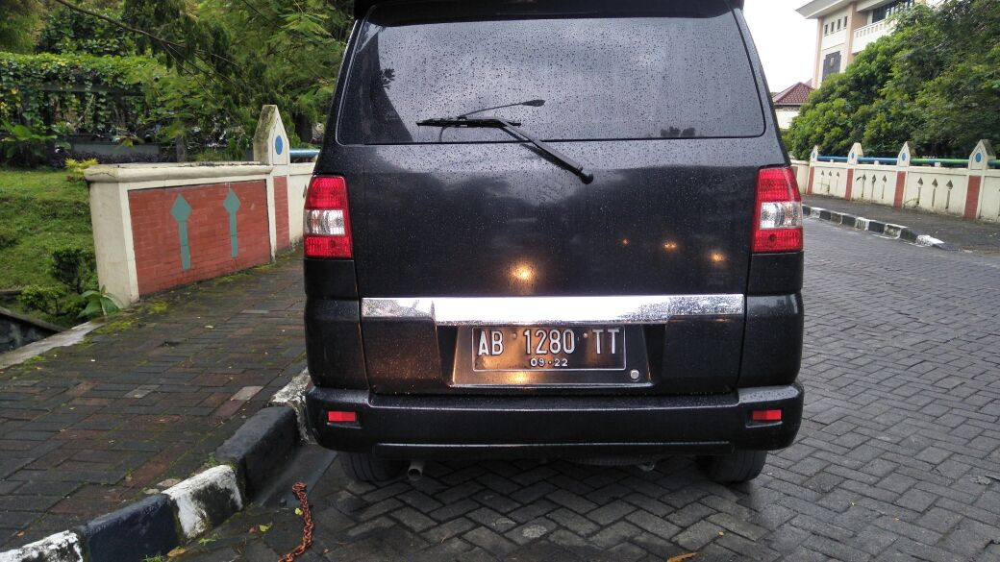

In [ ]:
img = io.imread('C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/images/train/IMG-20180108-WA0082.jpg')

fig = px.imshow(img)
fig.update_layout(width=700, height=400, margin=dict(l=10, r=10, b=10, t=10))
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
fig.show()

In [ ]:
# LOAD YOLO MODEL
net = cv2.dnn.readNetFromONNX('C:/Users/ACER/yolov5/runs/train/Model15/weights/best.onnx')
net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)

# DETECTION

In [ ]:
def get_detections(img,net):
    # 1.CONVERT IMAGE TO YOLO FORMAT
    image = img.copy()
    row, col, d = image.shape

    max_rc = max(row,col)
    input_image = np.zeros((max_rc,max_rc,3),dtype=np.uint8)
    input_image[0:row,0:col] = image

    # 2. GET PREDICTION FROM YOLO MODEL
    blob = cv2.dnn.blobFromImage(input_image,1/255,(INPUT_WIDTH,INPUT_HEIGHT),swapRB=True,crop=False)
    net.setInput(blob)
    preds = net.forward()
    detections = preds[0]
    
    return input_image, detections

def non_maximum_supression(input_image,detections):
    
    # 3. FILTER DETECTIONS BASED ON CONFIDENCE AND PROBABILIY SCORE
    
    # center x, center y, w , h, conf, proba
    boxes = []
    confidences = []

    image_w, image_h = input_image.shape[:2]
    x_factor = image_w/INPUT_WIDTH
    y_factor = image_h/INPUT_HEIGHT

    for i in range(len(detections)):
        row = detections[i]
        confidence = row[4] # confidence of detecting license plate
        if confidence > 0.4:
            class_score = row[5] # probability score of license plate
            if class_score > 0.25:
                cx, cy , w, h = row[0:4]

                left = int((cx - 0.5*w)*x_factor)
                top = int((cy-0.5*h)*y_factor)
                width = int(w*x_factor)
                height = int(h*y_factor)
                box = np.array([left,top,width,height])

                confidences.append(confidence)
                boxes.append(box)

    # 4.1 CLEAN
    boxes_np = np.array(boxes).tolist()
    confidences_np = np.array(confidences).tolist()
    
    # 4.2 NMS
    index = cv2.dnn.NMSBoxes(boxes_np,confidences_np,0.25,0.45)
    
    return boxes_np, confidences_np, index

def drawings(image,boxes_np,confidences_np,index):
    # 5. Drawings
    for ind in index:
        x,y,w,h =  boxes_np[ind]
        bb_conf = confidences_np[ind]
        conf_text = 'plate: {:.0f}%'.format(bb_conf*100)
        license_text = extract_text(image,boxes_np[ind])


        cv2.rectangle(image,(x,y),(x+w,y+h),(255,0,255),2)
        cv2.rectangle(image,(x,y-30),(x+w,y),(255,0,255),-1)
        cv2.rectangle(image,(x,y+h),(x+w,y+h+25),(0,0,0),-1)


        cv2.putText(image,conf_text,(x,y-10),cv2.FONT_HERSHEY_SIMPLEX,0.7,(255,255,255),1)
        cv2.putText(image,license_text,(x,y+h+27),cv2.FONT_HERSHEY_SIMPLEX,0.7,(0,255,0),1)

    return image

In [ ]:
# predictions flow with return result
def yolo_predictions(img,net):
    # step-1: detections
    input_image, detections = get_detections(img,net)
    # step-2: NMS
    boxes_np, confidences_np, index = non_maximum_supression(input_image, detections)
    # step-3: Drawings
    result_img = drawings(img,boxes_np,confidences_np,index)
    return result_img

In [ ]:
# extrating text
def extract_text(image,bbox):
    x,y,w,h = bbox
    roi = image[y:y+h, x:x+w]
    
    if 0 in roi.shape:
        return 'no number'
    
    else:
        text = pt.image_to_string(roi)
        text = text.strip()
        
        return text

In [ ]:
# test
img = io.imread('C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/images/train/IMG-20180108-WA0082.jpg')
results = yolo_predictions(img,net)


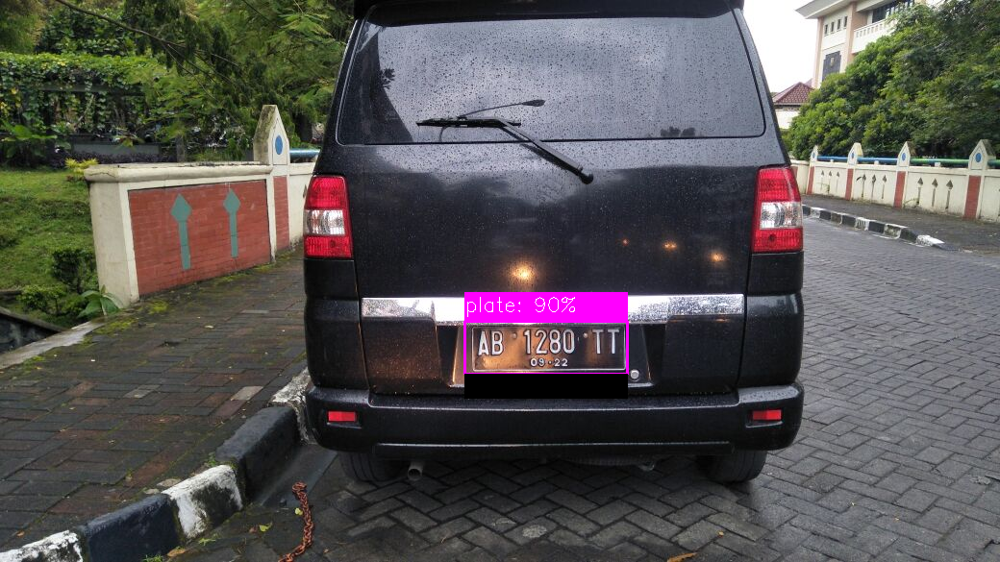

In [ ]:
fig = px.imshow(img)
fig.update_layout(width=700, height=400, margin=dict(l=10, r=10, b=10, t=10))
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
fig.show()

In [ ]:
# cap = cv2.VideoCapture('C:/Ilham/KULIAH/CODE/TA/auto-plate-recog-kaggle/170804_C_Lombok_047.mp4')
cap = cv2.VideoCapture(0)
while True:
    ret, frame = cap.read()
    
    if ret == False:
        print('Unable to read video')
        break
        
    results = yolo_predictions(frame,net)
    
    cv2.namedWindow('YOLO',cv2.WINDOW_KEEPRATIO)
    cv2.imshow('YOLO',results)
    if cv2.waitKey(30) == 27 :
        break
        
cv2.destroyAllWindows()
cap.release()

# REAL TIME DETECTION